In [ ]:
# !wget https://www.orand.cl/orand_car/ORAND-CAR-2014.tar.gz
# !tar -xf ORAND-CAR-2014.tar.gz

LOAD DATASET FROM DRIVE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


COUNT DATA SET IMAGE

In [ ]:
import os

def count_files_in_directories(directory_list):
  """Counts files in a list of directories.

  Args:
    directory_list: A list of directory paths.

  Returns:
    A dictionary containing directory paths as keys and file counts as values.
  """

  file_counts = {}
  for directory in directory_list:
    count = 0
    for root, _, files in os.walk(directory):
      count += len(files)
    file_counts[directory] = count
    print(f"directory:{directory}\n with count:{count}\n  ")
  return file_counts

# Example usage:
directories = ["/content/ORAND-CAR-2014/CAR-A/a_test_images", "/content/ORAND-CAR-2014/CAR-A/a_train_images", "/content/ORAND-CAR-2014/CAR-B/b_test_images","/content/ORAND-CAR-2014/CAR-B/b_train_images"]
result = count_files_in_directories(directories)
# print(f"total images:{}")


directory:/content/ORAND-CAR-2014/CAR-A/a_test_images
 with count:3784
  
directory:/content/ORAND-CAR-2014/CAR-A/a_train_images
 with count:2009
  
directory:/content/ORAND-CAR-2014/CAR-B/b_test_images
 with count:2926
  
directory:/content/ORAND-CAR-2014/CAR-B/b_train_images
 with count:3000
  


CALCULATE MAX LENGTH OF NUMBER EXIST IN IMAGE

In [ ]:
import csv

def read_column(filename):
  """Reads a specific column from a CSV file.

  Args:
    filename: The name of the CSV file.
    column_index: The index of the column to read (0-based).

  Returns:
    A list of values from the specified column.
  """
  min_len = 'ssssssssssssssssssssssssss'
  max_len = ''

  with open(filename, 'r') as csvfile:
    reader = csv.reader(csvfile)
    for row in reader:
      str_val = row[0].split('	')[1]
      if len(str_val)>len(max_len):
        max_len = str_val
      elif len(str_val) <len(min_len):# and len(str_val )!=0:
        min_len = str_val
  print(f"max_len:{max_len}\nwith length:{len(max_len)}\nmin_len:{min_len}\nwith length:{len(min_len)}")
    #   column_data.append(str_val)
  return max_len , min_len

directories = ["/content/ORAND-CAR-2014/CAR-A/a_test_gt.txt" , "/content/ORAND-CAR-2014/CAR-A/a_train_gt.txt" , "/content/ORAND-CAR-2014/CAR-B/b_test_gt.txt" , "/content/ORAND-CAR-2014/CAR-B/b_train_gt.txt"]

for i in range(len(directories)):
  read_column(directories[i])
  print()

max_len:10256400
with length:8
min_len:63
with length:2

max_len:67491288
with length:8
min_len:60
with length:2

max_len:10000000
with length:8
min_len:100
with length:3

max_len:10000000
with length:8
min_len:6262
with length:4



In this notebook, we'll go through the steps to train a CRNN (CNN+RNN) model for handwriting recognition. The model will be trained using the CTC(Connectionist Temporal Classification) loss.


![Webp.net-resizeimage.jpg](attachment:Webp.net-resizeimage.jpg)

Lets start by importing the necessary libraries. I'll be using Keras for building our CRNN model.

In [ ]:
!pip install python-Levenshtein

import os
import cv2
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import keras.callbacks
import tensorflow as tf
from keras import backend as K
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, Reshape, Bidirectional, LSTM, Dense, Lambda, Activation, BatchNormalization, Dropout
from keras.optimizers import Adam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 35.1 MB/s eta 0:00:00


# LOAD IMAGE AND LABELS

LOAD INFORMATION OF LABELS IN "t_labels"LOAD LABELS

In [ ]:
def extract_lables(path , complete_path):
    # Define the file path
  file_path = path

  # Initialize an empty list to store the tuples
  data_list = []
  # Open the file and read it line by line
  with open(file_path, 'r') as file:
      for line in file:
          # Strip any leading/trailing whitespace characters
          line = line.strip()

          # Split the line into parts (assuming space as delimiter; change if necessary)
          parts = line.split('	')

          # Extract the image file name and the integer value
          image_file = parts[0]
          # integer_value = int(len(parts[1]))
          string_lable =(parts[1])

          # Append the tuple to the list
          # data_list.append((image_file, integer_value))
          data_list.append((string_lable , complete_path+'/'+image_file))

  # Print the resulting list of tuples
  print(f"number of file:{len(data_list)}")
  return data_list

directories = ["/content/ORAND-CAR-2014/CAR-A/a_test_images", "/content/ORAND-CAR-2014/CAR-A/a_train_images", "/content/ORAND-CAR-2014/CAR-B/b_test_images","/content/ORAND-CAR-2014/CAR-B/b_train_images"]
label_directories =["/content/ORAND-CAR-2014/CAR-A/a_test_gt.txt" ,"/content/ORAND-CAR-2014/CAR-A/a_train_gt.txt","/content/ORAND-CAR-2014/CAR-B/b_test_gt.txt","/content/ORAND-CAR-2014/CAR-B/b_train_gt.txt" ]
t_labels=[]
for i in range(len(directories)):
  t_labels.extend(extract_lables(label_directories[i] , directories[i]))

# t_labels = np.array(t_labels)
print(len(t_labels))
print(f"label:{t_labels[4000][0]} , name:{t_labels[4000][1]}")
print(t_labels)
# print((labels.shape))

number of file:3784
number of file:2009
number of file:2926
number of file:3000
11719
label:5596 , name:/content/ORAND-CAR-2014/CAR-A/a_train_images/a_car_000370.png
[('1500', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007000.png'), ('5743', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007001.png'), ('1056', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007002.png'), ('1000', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007003.png'), ('1000', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007004.png'), ('2800', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007005.png'), ('1480', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007006.png'), ('3600', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007007.png'), ('300', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007008.png'), ('3000', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007009.png'), ('8548', '/content/ORAND-CAR-2014/CAR-A/a_test_images/a_car_007010.png'), ('20000', '/content/

LOAD IMAGE FROM LABELS PATH TO "IMAGES" VARIABLE

11719


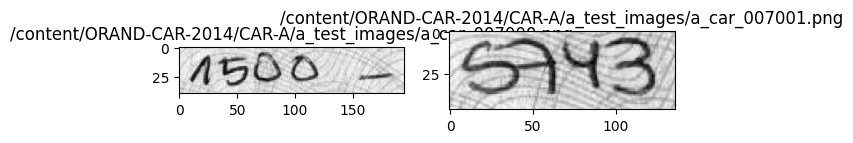

In [ ]:
import numpy as np
from PIL import Image
import os
import cv2
# Directory paths
directories = ["/content/ORAND-CAR-2014/CAR-A/a_test_images", "/content/ORAND-CAR-2014/CAR-A/a_train_images", "/content/ORAND-CAR-2014/CAR-B/b_test_images","/content/ORAND-CAR-2014/CAR-B/b_train_images"]


# Load images
images = []
for file in t_labels:
      image = cv2.imread(file[1], cv2.IMREAD_GRAYSCALE)
      images.append((image,file[1]))



print(len(images))
# print(images)
plt.subplot(1,2,1)
plt.imshow(images[0][0], cmap='gray')
plt.title(images[0][1])
plt.subplot(1,2,2)
plt.title(images[1][1])
plt.imshow(images[1][0], cmap='gray')

## Preprocessing and preparing the images for training

* The images are loaded as grayscale and reshaped to width 256 and height 64.  
* The width and height are cropped if they are greater than 256 and 64 respectively. If they are smaller, then the image is padded with white pixels. Finally the image is rotated clockwise to bring the image shape to (x, y).
* The image is then normalized to range [0, 1]

In [ ]:
width_reshape = 256
height_reshape = 64
def preprocess(img):
    (h, w) = img.shape

    final_img = np.ones([height_reshape, width_reshape])*255 # blank white image

    # crop
    if w > width_reshape:
        img = img[:, :width_reshape]

    if h > height_reshape:
        img = img[:height_reshape, :]


    final_img[:h, :w] = img
    return cv2.rotate(final_img, cv2.ROTATE_90_CLOCKWISE)

80 percent for train , 20 percent for test

In [ ]:
total_images = len(images)
train_size = int(0.8 * total_images)
valid_size= total_images - train_size
print(train_size)
print(valid_size)

#this approach is pick image random not respectively
max_value = len(images)
count = train_size
all_numbers = set(range(max_value))
train_x_index = set(random.sample(range(max_value), count))

valid_x_index =list(all_numbers - train_x_index)
train_x_index = list(train_x_index)

print(len(train_x_index))
print(len(valid_x_index))

9375
2344
9375
2344


SEPARATE TRAINING IMAGE AND PLACE IT IN "train_x" VARIABLE

9375


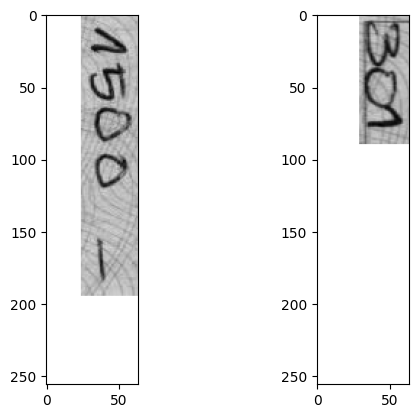

In [ ]:
# train_images = images[:train_size]
train_x =[]
for i in range(train_size):
    image = images[train_x_index[i]]
    image = preprocess(image[0])
    image = image/255.
    train_x.append(image)
print(len(train_x))
plt.subplot(1,2,1)
plt.imshow(train_x[0], cmap='gray')
plt.subplot(1,2,2)
plt.imshow(train_x[100], cmap='gray')

SEPARATE TEST IMAGE IN AND PLACE IT IN "valid_x" VARIABLE

2344


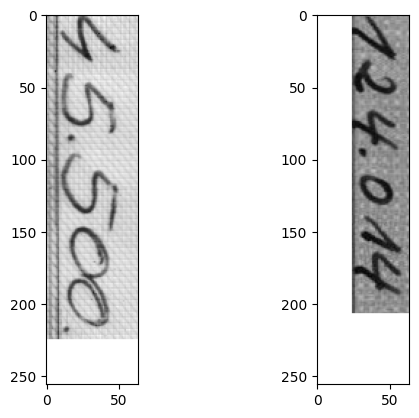

In [ ]:
valid_x = []

for i in range(valid_size):
    image = images[valid_x_index[i]]
    image = preprocess(image[0])
    image = image/255.
    valid_x.append(image)
print(len(valid_x))
plt.subplot(1,2,1)
plt.imshow(valid_x[0], cmap='gray')
plt.subplot(1,2,2)
plt.imshow(valid_x[100], cmap='gray')

RESHAPE TO REQUIRED SHAPE

In [ ]:
train_x = np.array(train_x).reshape(-1, width_reshape, height_reshape, 1)
valid_x = np.array(valid_x).reshape(-1, width_reshape, height_reshape, 1)
print(train_x.shape)
print(valid_x.shape)

(9375, 256, 64, 1)
(2344, 256, 64, 1)


## Preparing the labels for CTC Loss

Learn more about CTC loss and why its amazing for text recognition from [here](https://theailearner.com/2019/05/29/connectionist-temporal-classificationctc/).

The labels have to be converted to numbers which represent each character in the training set. The 'alphabets' consist of A-Z and three special characters (-  '  and space).

In [ ]:
alphabets = u"0123456789 "
# max_str_len = 24 # max length of input labels
max_str_len = 8 # max length of input labels
num_of_characters = len(alphabets) + 1 # +1 for ctc pseudo blank
num_of_timestamps = 64 # max length of predicted labels


def label_to_num(label):
    label_num = []
    for ch in label:
        label_num.append(alphabets.find(ch))

    return np.array(label_num)

def num_to_label(num):
    ret = ""
    for ch in num:
        if ch == -1:  # CTC Blank
            break
        else:
            ret+=alphabets[ch]
    return ret

* **train_y** contains the true labels converted to numbers and padded with -1. The length of each label is equal to max_str_len.
* **train_label_len** contains the length of each true label (without padding)
* **train_input_len** contains the length of each predicted label. The length of all the predicted labels is constant i.e number of timestamps - 2.  
* **train_output** is a dummy output for ctc loss.


In [ ]:
def prepare_for_ctc(dataset_size , max_str_len,num_of_timestamps , true_labels):
  y = np.ones([dataset_size, max_str_len]) * -1
  label_len = np.zeros([dataset_size, 1])
  input_len = np.ones([dataset_size, 1]) * (num_of_timestamps-2)
  output = np.zeros([dataset_size])

  for i in range(dataset_size):
      # print(i)
      label_len[i] = len(true_labels[i])

      y[i, 0:len(true_labels[i])]= label_to_num(true_labels[i])

  print('true label',true_labels[124],'\ny : ',y[124],'\nlabel_len : ',label_len[124] , input_len[124],
        output[124])
  return y , label_len , input_len , output



true label 2965578 
y :  [ 2.  9.  6.  5.  5.  7.  8. -1.] 
label_len :  [7.] [62.] 0.0
9375


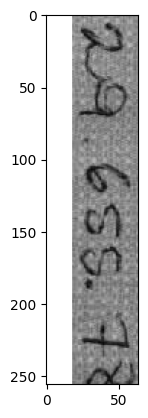

In [ ]:

train_y , train_label_len , train_input_len,train_output = prepare_for_ctc(train_size , max_str_len ,num_of_timestamps ,[t_labels[i][0] for i in train_x_index])


print(len(train_y))
plt.imshow(train_x[124],cmap = 'gray')

In [ ]:
valid_y , valid_label_len , valid_input_len , valid_output = prepare_for_ctc(valid_size , max_str_len ,num_of_timestamps , [t_labels[i][0] for i in valid_x_index])

print(len(valid_y))

true label 16643 
y :  [ 1.  6.  6.  4.  3. -1. -1. -1.] 
label_len :  [5.] [62.] 0.0
2344


SOME REPRESENTATION OF DATA

True label :  368552 
path :  /content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_003760.png 
valid_y :  [ 3.  6.  8.  5.  5.  2. -1. -1.] 
valid_label_len :  [6.] 
valid_input_len :  [62.]


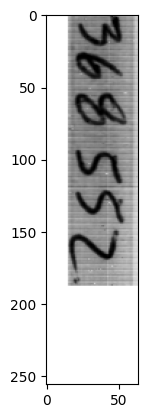

In [ ]:
plt.imshow(valid_x[12] , cmap = 'gray')
print('True label : ',t_labels[12+train_size][0],'\npath : ',t_labels[12+train_size][1] , '\nvalid_y : ',valid_y[12],'\nvalid_label_len : ',valid_label_len[12],
      '\nvalid_input_len : ', valid_input_len[12])

## Building our model


In [ ]:
input_data = Input(shape=(width_reshape, height_reshape, 1), name='input')

inner = Conv2D(32, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

inner = Conv2D(64, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)
inner = Dropout(0.3)(inner)

inner = Conv2D(128, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)
inner = Dropout(0.3)(inner)

# CNN to RNN
inner = Reshape(target_shape=((64, 1024)), name='reshape')(inner)#*******************
inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)

## RNN
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm1')(inner)
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm2')(inner)

## OUTPUT
inner = Dense(num_of_characters, kernel_initializer='he_normal',name='dense2')(inner)
y_pred = Activation('softmax', name='softmax')(inner)

model = Model(inputs=input_data, outputs=y_pred)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 256, 64, 1)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 256, 64, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 64, 32)         │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256, 64, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max1 (MaxPooling2D)                  │ (None, 128, 32, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 128, 32, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 32, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 128, 32, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max2 (MaxPooling2D)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 64, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 64, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max3 (MaxPooling2D)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 1024)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 64, 64)              │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm1 (Bidirectional)                │ (None, 64, 512)             │         657,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm2 (Bidirectional)                │ (None, 64, 512)             │       1,574,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense2 (Dense)                       │ (None, 64, 12)              │           6,1

 Total params: 2,397,644 (9.15 MB)

 Trainable params: 2,397,196 (9.14 MB)

 Non-trainable params: 448 (1.75 KB)

The output shape of the predictions is (64, 30). The model predicts words of 64 characters and each character contains the probability of the 30 alphabets which we defined earlier.  

In [ ]:
# the ctc loss function
import tensorflow as tf


def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

## Train our model

In [ ]:
# the loss calculation occurs elsewhere, so we use a dummy lambda function for the loss
model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

def scheduler(epoch, lr):
  if epoch != 19:
      return lr
  else:
      return 0.0001
call_back = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience= 6),#*************
    keras.callbacks.ModelCheckpoint(filepath= 'C_LSTM_best.keras', save_best_only= True, monitor="val_loss", verbose= 1),
    # keras.callbacks.LearningRateScheduler(scheduler, verbose=1)
]
model_final.fit(x=[train_x, train_y, train_input_len, train_label_len], y=train_output,
                validation_data=([valid_x, valid_y, valid_input_len, valid_label_len], valid_output),
                epochs=60, batch_size=128,
                callbacks=call_back,
                shuffle = True
)

Epoch 1/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - loss: 21.1382
Epoch 1: val_loss improved from inf to 14.73691, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 26s 288ms/step - loss: 21.0429 - val_loss: 14.7369


/usr/local/lib/python3.10/dist-packages/keras/src/saving/serialization_lib.py:390: UserWarning: The object being serialized includes a `lambda`. This is unsafe. In order to reload the object, you will have to pass `safe_mode=False` to the loading function. Please avoid using `lambda` in the future, and use named Python functions instead. This is the `lambda` being serialized: model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

  return {key: serialize_keras_object(value) for key, value in obj.items()}


Epoch 2/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - loss: 11.4066
Epoch 2: val_loss improved from 14.73691 to 11.60639, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 20s 268ms/step - loss: 11.4051 - val_loss: 11.6064
Epoch 3/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - loss: 10.7460
Epoch 3: val_loss improved from 11.60639 to 10.28204, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 22s 286ms/step - loss: 10.7429 - val_loss: 10.2820
Epoch 4/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - loss: 9.1702
Epoch 4: val_loss improved from 10.28204 to 7.50595, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 9.1620 - val_loss: 7.5060
Epoch 5/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 5.7590
Epoch 5: val_loss improved from 7.50595 to 3.29465, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 22s 287ms/step - loss: 5.7458 - val_loss: 3.2947
Epoch 6/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 2.6826
Epoch 

## Check model performance on validation set

In [ ]:
# preds = model.predict(valid_x , verbose = 0)
preds = model.predict(valid_x )
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 52s 688ms/step


In [ ]:
import Levenshtein
# y_true = [tup[0] for tup in t_labels[train_size:]]
y_true = [t_labels[index][0]for index in valid_x_index ]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
# print(f"Average Levenshtein distance: {total_distance / total_char}") #this approach is better than last line
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.048208191126279866
Correct characters predicted : 98.67%
Correct words predicted      : 96.20%
false prediction:89


In [ ]:
true_and_predict=[]
y_true = [tup[0] for tup in t_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1
            true_and_predict.append((tr[j],pr[j]))
    if pr == tr :
        correct += 1
    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

predicted_analysis ={}

for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]

    for j in range(max(len(tr), len(pr))):
        if j >= len(tr):
            true_and_predict.append((' ',pr[j]))
        elif j >= len(pr):
            true_and_predict.append((tr[j],' '))
        else:
            true_and_predict.append((tr[j],pr[j]))

for i in range(len(true_and_predict)):
  temp = true_and_predict[i]
  if temp[0] == ' ':
    if ('-1',temp[1]) not in predicted_analysis:
      predicted_analysis[('-1',temp[1])] = 0
    else:
      predicted_analysis[('-1',temp[1])] += 1
  elif temp[1] == ' ':
    if (temp[0],'-1') not in predicted_analysis:
      predicted_analysis[(temp[0],'-1')] = 0
    else:
      predicted_analysis[temp[0],'-1'] += 1
  else:
    if temp not in predicted_analysis:
      predicted_analysis[temp] = 0
    else:
      predicted_analysis[temp[0],temp[1]] += 1


print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction count:{len(False_prediction)}")
print(sorted(predicted_analysis.items(), key=lambda item: item[1] , reverse = True))


Correct characters predicted : 97.89%
Correct words predicted      : 91.55%
false prediction count:198
[(('0', '0'), 11427), (('1', '1'), 2369), (('2', '2'), 2085), (('5', '5'), 1995), (('3', '3'), 1647), (('4', '4'), 1511), (('6', '6'), 1251), (('8', '8'), 1213), (('7', '7'), 1103), (('9', '9'), 1065), (('-1', '0'), 20), (('0', '-1'), 16), (('5', '6'), 10), (('5', '0'), 9), (('2', '0'), 9), (('6', '0'), 7), (('0', '6'), 7), (('4', '7'), 7), (('0', '2'), 6), (('1', '4'), 6), (('9', '4'), 6), (('2', '3'), 5), (('8', '0'), 5), (('9', '8'), 5), (('8', '9'), 4), (('3', '7'), 4), (('3', '8'), 4), (('9', '0'), 4), (('6', '8'), 4), (('0', '1'), 4), (('1', '2'), 4), (('2', '9'), 4), (('-1', '1'), 3), (('4', '1'), 3), (('5', '9'), 3), (('3', '5'), 3), (('0', '5'), 3), (('9', '2'), 3), (('7', '4'), 3), (('8', '1'), 3), (('6', '1'), 3), (('4', '9'), 3), (('3', '1'), 3), (('3', '2'), 3), (('1', '0'), 3), (('8', '6'), 2), (('7', '1'), 2), (('0', '9'), 2), (('1', '6'), 2), (('6', '5'), 2), (('5', '3

In [ ]:
res = 0
for i in predicted_analysis.items():
  if i[0][0]!=i[0][1]:
    if i[0][1] == '0':
      res+=i[1]
print(res)

58


In [ ]:
which_character_false_predicted={}
which_character_false_predicted['-1'] = 0
# print(predicted_analysis)
for i in range(10):
  which_character_false_predicted[str(i)] = 0

for i in predicted_analysis.items():
  if i[0][0] !=i[0][1]:
    which_character_false_predicted[i[0][0]] += i[1]
print(sorted(which_character_false_predicted.items(), key=lambda item: item[1] , reverse = True))

[('0', 39), ('5', 29), ('-1', 26), ('2', 20), ('9', 20), ('6', 18), ('8', 18), ('3', 17), ('1', 15), ('4', 14), ('7', 9)]


analysis

[118, 821, 511, 973, 881, 1778, 580]
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_003881.png
1/1 [==============================] - 0s 276ms/step
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_004688.png
1/1 [==============================] - 0s 21ms/step
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_004337.png
1/1 [==============================] - 0s 23ms/step
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_004865.png
1/1 [==============================] - 0s 21ms/step
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_004757.png
1/1 [==============================] - 0s 21ms/step
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_005785.png
1/1 [==============================] - 0s 21ms/step
/content/ORAND-CAR-2014/CAR-B/b_train_images/b_car_004414.png
1/1 [==============================] - 0s 21ms/step


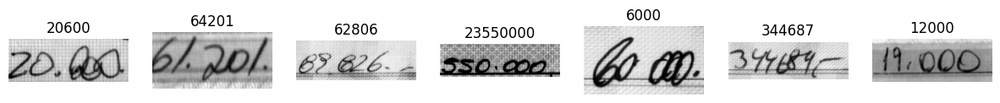

In [ ]:
def prediction(gray_img):
  image = preprocess(gray_img)
  image = image/255.
  pred = model.predict(image.reshape(1, 256, 64, 1))
  decoded = K.get_value(K.ctc_decode(pred, input_length=np.ones(pred.shape[0])*pred.shape[1],
                                      greedy=True)[0][0])
  res = num_to_label(decoded[0])
  return res


random_number =random.sample(False_prediction, 7)
print(random_number)

x = 1
plt.figure(figsize=(15, 35))
for i in random_number:
  plt.subplot(1,7,x)
  x+=1
  print(images[train_size+i][1])
  plt.imshow(images[train_size+i][0], cmap='gray')
  plt.title(prediction(images[train_size+i][0]))
  plt.axis('off')

In [ ]:
def prediction(gray_img):
  image = preprocess(gray_img)
  image = image/255.
  pred = model.predict(image.reshape(1, 256, 64, 1) ,verbose=0 )
  decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(pred, input_length=np.ones(pred.shape[0])*pred.shape[1],
                                      greedy=True)[0][0])
  res = num_to_label(decoded[0])
  return res

num_images = len(False_prediction)
num_columns = 10
num_rows = (num_images // num_columns) + (1 if num_images % num_columns != 0 else 0)

# Create a figure with a grid of subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 2))

# Flatten the axes array for easy iteration
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < num_images:
        img =images[train_size+False_prediction[i]][0]

        ax.imshow(img,cmap = 'gray')
        ax.set_title(prediction(images[train_size+False_prediction[i]][0]), fontsize=12)

        # ax.title(prediction(images[train_size+False_prediction[i]][0]))
        ax.axis('off')  # Hide the axes
    else:
        ax.axis('off')  # Hide any empty subplot

plt.tight_layout()
plt.show()

MY BEST PREDICTION WITH FOURIER TRANSFORM

In [ ]:
fourier_valid_x = [delete_noise_with_fourier(np.squeeze(img)) for img in valid_x]

# fourier_train_x = np.array(fourier_train_x).reshape(-1, width_reshape, height_reshape, 1)
fourier_valid_x = np.array(fourier_valid_x).reshape(-1, width_reshape, height_reshape, 1)
preds = model.predict(fourier_valid_x , verbose = 0)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

In [ ]:
import Levenshtein
y_true = [tup[0] for tup in t_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.10110921501706485
Correct characters predicted : 97.90%
Correct words predicted      : 91.60%
false prediction:197


## Some predictions on test set

In [ ]:

directories = ["/content/ORAND-CAR-2014/CAR-A/a_test_images", "/content/ORAND-CAR-2014/CAR-A/a_train_images", "/content/ORAND-CAR-2014/CAR-B/b_test_images","/content/ORAND-CAR-2014/CAR-B/b_train_images"]
label_directories =["/content/ORAND-CAR-2014/CAR-A/a_test_gt.txt" ,"/content/ORAND-CAR-2014/CAR-A/a_train_gt.txt","/content/ORAND-CAR-2014/CAR-B/b_test_gt.txt","/content/ORAND-CAR-2014/CAR-B/b_train_gt.txt" ]
def read_image_path_from_csv(path):
  data_list = []
  with open(path, 'r') as file:
        for line in file:
            # Strip any leading/trailing whitespace characters
            line = line.strip()

            # Split the line into parts (assuming space as delimiter; change if necessary)
            parts = line.split('	')

            # Extract the image file name and the integer value
            image_file = parts[0]
            # integer_value = int(len(parts[1]))
            # string_lable =(parts[1])

            # Append the tuple to the list
            # data_list.append((image_file, integer_value))
            data_list.append((image_file))
  return data_list

paths = [tup[1] for tup in images[:5]]
paths.append('/content/123.png')

plt.figure(figsize=(15, 10))
for i in range(0,6):
    ax = plt.subplot(2, 3, i+1)

    img_dir=paths[i]
    image = cv2.imread(img_dir, cv2.IMREAD_GRAYSCALE)
    plt.imshow(image, cmap='gray')

    image = preprocess(image)
    image = image/255.
    pred = model.predict(image.reshape(1, 256, 64, 1))
    decoded = K.get_value(K.ctc_decode(pred, input_length=np.ones(pred.shape[0])*pred.shape[1],
                                       greedy=True)[0][0])
    plt.title(num_to_label(decoded[0]), fontsize=12)
    plt.axis('off')

plt.subplots_adjust(wspace=0.2, hspace=-0.8)

## Ways to improve the model

* Use more training samples. This will help the model to learn and generalise better. I have used only 10% of the images as the entire training set cannot be loaded into kaggle's memory.
* There are multiple images in the training set which are not at all legible to the human eye. Removing such images will help in model's learning.

# TRY TO IMPROVE WITH DATA AUGMENTATION

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define your data augmentation parameters
data_gen_args = dict(
    zoom_range=0.2,
    rotation_range=5,
    width_shift_range=0.06,
    height_shift_range=0.06,
)

# Create an instance of ImageDataGenerator
image_datagen = ImageDataGenerator(**data_gen_args)
print(f"shape before augmentation:{len(train_x)}")

# Custom augmentation function
def augment_images(images , t_labels):
    augmented_images = []
    augmented_t_labels = []

    for image , label in zip(images , t_labels):
        image = np.expand_dims(image, 0)  # Add batch dimension
        augmented_image = next(image_datagen.flow(image, batch_size=1))[0]  # Remove batch dimension
        augmented_images.append(augmented_image)
        augmented_t_labels.append(label)
    return np.array(augmented_images) , augmented_t_labels

augmentated_data , augmented_labels = augment_images(train_x,t_labels)
combined_images = np.concatenate((augmentated_data, train_x), axis=0)
combined_labels = augmented_labels + t_labels

print(f"shape of combined_images:{combined_images.shape}")
print(f"shape of combined_labels:{len(combined_labels)}")

shape before augmentation:9375
shape of combined_images:(18750, 256, 64, 1)
shape of combined_labels:21094


In [ ]:
last_total_images = len(images)
last_train_size = int(0.8 * total_images)
last_valid_size= total_images - train_size
print(last_train_size)
print(last_valid_size)

9375
2344


true label 4561 
train_y :  [ 4.  5.  6.  1. -1. -1. -1. -1.] 
train_label_len :  [4.] [62.] 0.0


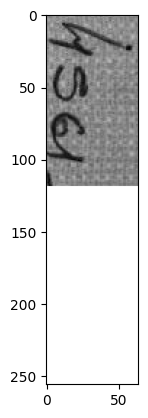

In [ ]:
train_size = last_train_size*2

train_augmented_y = np.ones([train_size, max_str_len]) * -1
train_augmented_label_len = np.zeros([train_size, 1])
train_augmented_input_len = np.ones([train_size, 1]) * (num_of_timestamps-2)
train_augmented_output = np.zeros([train_size])

for i in range(train_size):
    train_augmented_label_len[i] = len(combined_labels[i][0])
    train_augmented_y[i, 0:len(combined_labels[i][0])]= label_to_num(combined_labels[i][0])


plt.imshow(train_x[200],cmap = 'gray')
# print(t)
print('true label',combined_labels[200][0],'\ntrain_y : ',train_augmented_y[200],'\ntrain_label_len : ',train_augmented_label_len[200] , train_augmented_input_len[200],
      train_augmented_output[200])

In [ ]:
valid_size = last_valid_size
valid_augmented_y = np.ones([valid_size, max_str_len]) * -1
valid_augmented_label_len = np.zeros([valid_size, 1])
valid_augmented_input_len = np.ones([valid_size, 1]) * (num_of_timestamps-2)
valid_augmented_output = np.zeros([valid_size])

for i in range(valid_size):
    valid_augmented_label_len[i] = len(combined_labels[i+train_size][0])
    valid_augmented_y[i, 0:len(combined_labels[i+train_size][0])]= label_to_num(combined_labels[i+train_size][0])

In [ ]:
# the ctc loss function
import tensorflow as tf
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

In [ ]:
combined_valid_images = valid_x
print(f"total trian:{len(combined_images)}")
print(f"total train:{combined_images.shape}")
print(f"total valid:{combined_valid_images.shape}")

total trian:18750
total train:(18750, 256, 64, 1)
total valid:(2344, 256, 64, 1)


In [ ]:
call_back = [
     keras.callbacks.EarlyStopping(monitor="val_loss", patience=6),
     keras.callbacks.ModelCheckpoint(filepath='CRNN_with_augmentation.keras', save_best_only=True, monitor="val_loss", verbose=1),
      # keras.callbacks.LearningRateScheduler(scheduler, verbose=1)

]

model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

model_final.fit(x=[combined_images, train_augmented_y, train_augmented_input_len, train_augmented_label_len], y=train_augmented_output, batch_size=128,
                validation_data=([combined_valid_images, valid_augmented_y, valid_augmented_input_len, valid_augmented_label_len], valid_augmented_output),
                epochs=60,
                callbacks=call_back)


Epoch 1/60
147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 16.6340
Epoch 1: val_loss improved from inf to 12.44298, saving model to CRNN_with_augmentation.keras


/usr/local/lib/python3.10/dist-packages/keras/src/saving/serialization_lib.py:390: UserWarning: The object being serialized includes a `lambda`. This is unsafe. In order to reload the object, you will have to pass `safe_mode=False` to the loading function. Please avoid using `lambda` in the future, and use named Python functions instead. This is the `lambda` being serialized: model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

  return {key: serialize_keras_object(value) for key, value in obj.items()}


147/147 ━━━━━━━━━━━━━━━━━━━━ 54s 278ms/step - loss: 16.6067 - val_loss: 12.4430
Epoch 2/60
147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - loss: 11.2868
Epoch 2: val_loss improved from 12.44298 to 10.65653, saving model to CRNN_with_augmentation.keras
147/147 ━━━━━━━━━━━━━━━━━━━━ 72s 266ms/step - loss: 11.2853 - val_loss: 10.6565
Epoch 3/60
147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 254ms/step - loss: 9.7754
Epoch 3: val_loss improved from 10.65653 to 7.60061, saving model to CRNN_with_augmentation.keras
147/147 ━━━━━━━━━━━━━━━━━━━━ 42s 272ms/step - loss: 9.7685 - val_loss: 7.6006
Epoch 4/60
147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - loss: 4.9919
Epoch 4: val_loss improved from 7.60061 to 3.32975, saving model to CRNN_with_augmentation.keras
147/147 ━━━━━━━━━━━━━━━━━━━━ 40s 269ms/step - loss: 4.9858 - val_loss: 3.3297
Epoch 5/60
147/147 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - loss: 2.5997
Epoch 5: val_loss improved from 3.32975 to 1.05289, saving model to CRNN_with_augmentation.keras
147/147 ━━━━━━━━

EVALUATION

In [ ]:
# !cp /content/CRNN_with_augmentation.keras /content/drive/MyDrive
# !cp /content/drive/MyDrive/CRNN_with_augmentation.keras .
# model_path='/content/CRNN_with_augmentation.keras'
# model.load_weights(model_path)

In [ ]:
preds = model.predict(combined_valid_images)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step


In [ ]:
import Levenshtein

# print(Levenshtein.distance('fs', 'fa'))
y_true = [tup[0] for tup in combined_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.14803754266211605
Correct characters predicted : 95.23%
Correct words predicted      : 87.37%
false prediction:296


# AUGMENT 20% OF DATA

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Define your data augmentation parameters
data_gen_args = dict(
    zoom_range=0.2,
    rotation_range=5,
    width_shift_range=0.06,
    height_shift_range=0.06,
)

# Create an instance of ImageDataGenerator
image_datagen = ImageDataGenerator(**data_gen_args)
print(f"shape before augmentation:{len(train_x)}")
# plt.imshow(images[0][0], cmap='gray')
# Custom augmentation function
def augment_images(images , t_labels):

    augmented_images = []
    augmented_t_labels = []

    for image , label in zip(images , t_labels):
        image = np.expand_dims(image, 0)  # Add batch dimension
        augmented_image = next(image_datagen.flow(image, batch_size=1))[0]  # Remove batch dimension
        augmented_images.append(augmented_image)
        augmented_t_labels.append(label)
    return np.array(augmented_images) , augmented_t_labels
temp_size = int(0.2*(len(train_x)))
augmented_data , augmented_labels = augment_images(train_x[:temp_size],t_labels[:temp_size])
combined_images = np.concatenate((augmented_data, train_x), axis=0)
combined_labels = augmented_labels + t_labels

print(f"shape of combined_images:{combined_images.shape}")
print(f"shape of combined_labels:{len(combined_labels)}")

print(f"number of augmented image{temp_size}")

shape before augmentation:9375
shape of combined_images:(11250, 256, 64, 1)
shape of combined_labels:13594
number of augmented image1875


In [ ]:
last_total_images = len(images)
last_train_size = int(0.8 * total_images)
last_valid_size= total_images - last_train_size
print(last_train_size)
print(last_valid_size)

9375
2344


true label 38117 
y :  [ 3.  8.  1.  1.  7. -1. -1. -1.] 
label_len :  [5.] [62.] 0.0


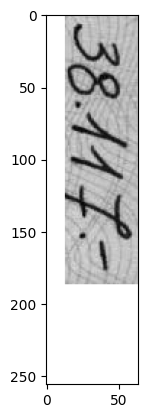

In [ ]:
train_size = last_train_size+(len(augmented_data))

train_augmented_y , train_augmented_label_len ,train_augmented_input_len,train_augmented_output = prepare_for_ctc(train_size , max_str_len , num_of_timestamps ,[label [0] for label in combined_labels[:train_size]] )

plt.imshow(train_x[12],cmap = 'gray')

In [ ]:
valid_size = last_valid_size

valid_augmented_y , valid_augmented_label_len ,valid_augmented_input_len,valid_augmented_output = prepare_for_ctc(valid_size , max_str_len , num_of_timestamps ,[label [0] for label in combined_labels[train_size:]] )

true label 368552 
y :  [ 3.  6.  8.  5.  5.  2. -1. -1.] 
label_len :  [6.] [62.] 0.0


In [ ]:
# the ctc loss function
import tensorflow as tf
def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

In [ ]:
combined_valid_images = valid_x
print(f"combined_images:{len(combined_images)}")
print(f"combined_images.shape:{combined_images.shape}")
print(f"combined_valid_images:{combined_valid_images.shape}")

combined_images:11250
combined_images.shape:(11250, 256, 64, 1)
combined_valid_images:(2344, 256, 64, 1)


In [ ]:

def scheduler(epoch, lr):
  if epoch != 19:
      return lr
  else:
      return 0.0001

call_back = [
     keras.callbacks.EarlyStopping(monitor="val_loss", patience=6),
     keras.callbacks.ModelCheckpoint(filepath='CRNN_with_augmentation.keras', save_best_only=True, monitor="val_loss", verbose=1),
      keras.callbacks.LearningRateScheduler(scheduler, verbose=1)

]

model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

model_final.fit(x=[combined_images, train_augmented_y, train_augmented_input_len, train_augmented_label_len], y=train_augmented_output, batch_size=128,
                validation_data=([combined_valid_images, valid_augmented_y, valid_augmented_input_len, valid_augmented_label_len], valid_augmented_output),
                epochs=60,
                callbacks=call_back)



Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/60
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - loss: 18.8613
Epoch 1: val_loss improved from inf to 12.84332, saving model to CRNN_with_augmentation.keras


/usr/local/lib/python3.10/dist-packages/keras/src/saving/serialization_lib.py:390: UserWarning: The object being serialized includes a `lambda`. This is unsafe. In order to reload the object, you will have to pass `safe_mode=False` to the loading function. Please avoid using `lambda` in the future, and use named Python functions instead. This is the `lambda` being serialized: model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

  return {key: serialize_keras_object(value) for key, value in obj.items()}


88/88 ━━━━━━━━━━━━━━━━━━━━ 41s 316ms/step - loss: 18.7999 - val_loss: 12.8433 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/60
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - loss: 11.4687
Epoch 2: val_loss improved from 12.84332 to 12.05196, saving model to CRNN_with_augmentation.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 30s 279ms/step - loss: 11.4676 - val_loss: 12.0520 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/60
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 256ms/step - loss: 11.0700
Epoch 3: val_loss improved from 12.05196 to 10.42790, saving model to CRNN_with_augmentation.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 41s 277ms/step - loss: 11.0678 - val_loss: 10.4279 - learning_rate: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 4/60
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step - loss: 9.9506
Epoch 4: val_loss improved from 10.42790 to 8.80174, 

In [ ]:
preds = model.predict(combined_valid_images)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step


In [ ]:
import Levenshtein

# print(Levenshtein.distance('fs', 'fa'))
y_true = [tup[0] for tup in combined_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.13267918088737202
Correct characters predicted : 96.79%
Correct words predicted      : 88.91%
false prediction:260


# TRY TO IMPROVE WITH **fourier transform**

In [ ]:
def plot_all_images(images ):
  num_images = len(images)
  print(f"total image:{num_images}")
  num_columns = 10
  num_rows = (num_images // num_columns) + (1 if num_images % num_columns != 0 else 0)

  # Create a figure with a grid of subplots
  fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 2))

  # Flatten the axes array for easy iteration
  axes = axes.flatten()

  for i, ax in enumerate(axes):
      if i < num_images:
          img =images[i]

          ax.imshow(img,cmap = 'gray')
          # ax.imshow(img)
          ax.set_title(prediction(img), fontsize=12)

          # ax.title(prediction(images[train_size+False_prediction[i]][0]))
          ax.axis('off')  # Hide the axes
      else:
          ax.axis('off')  # Hide any empty subplot

  plt.tight_layout()
  plt.show()

In [ ]:
def prediction(gray_img):
  image = preprocess(gray_img)
  image = image/255.
  pred = model.predict(image.reshape(1, 256, 64, 1) ,verbose=0 )
  decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(pred, input_length=np.ones(pred.shape[0])*pred.shape[1],
                                      greedy=True)[0][0])
  res = num_to_label(decoded[0])
  return res



temp_labels =[ t_labels[index][0]for index in valid_x_index]
temp_images =[ images[index][0]for index in valid_x_index]
y_true =  [temp_labels[i] for i in False_prediction]
corrosponding_images = [temp_images[i] for i in False_prediction]

correct_char = 0
total_char = 0
correct = 0

#for levenshtein distance
total_distance = 0
comparisons= 0

# False_prediction = []
print(f"total words:{len(y_true)}")
for i in range(len(y_true)):
    pr = prediction(corrosponding_images[i])
    tr = y_true[i]
    total_char += len(tr)
    # print(f"true : {tr} , pred : {pr}")
    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/len(y_true)))
# print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))

total words:89
Average Levenshtein distance: 1.2696629213483146
Correct characters predicted : 65.66%
Correct words predicted      : 0.00%


In [ ]:
def black_vertical_center_line(img):
  height, width= img.shape

  # Calculate center x-coordinate
  center_x = width // 2

  # Draw a black vertical line
  cv2.line(img, (center_x, 0), (center_x, height), (0, 0, 0), thickness=1)

def fill_black_out_of_circle(image):
  '''
  create specific circle
  with bitwise_and all pixel within circle remain but out of circle get zero value
  '''
  # Create a mask
  mask = np.zeros(image.shape[:2], dtype="uint8")

  # Draw a circle on the mask
  # cv2.circle(mask, (645, 407), 100, 255, -1)
  r = (50*mask.shape[0])//100
  cv2.circle(mask, (mask.shape[1]//2,mask.shape[0]//2), r, 255, -1)

  # Apply the mask to the image
  masked_image = cv2.bitwise_and(image, image, mask=mask)
  # black_vertical_center_line(masked_image)
  return masked_image

def delete_noise_with_fourier(img):
  '''
  transform to frequency space
  shift for better visualization and noise deletion
  just keep center(circle with specific radius)
  reconstruc image with phase and magnitude
  '''
  # Convert image to float32 for better precision
  img_float32 = np.float32(img)

  # Compute 2D FFT
  dft = np.fft.fft2(img_float32)

  # Shift zero-frequency to center
  dft_shifted = np.fft.fftshift(dft)

  # Calculate magnitude (amplitude)
  old_magnitude_spectrum = np.abs(dft_shifted)

  new_magnitude_spectrum = fill_black_out_of_circle(old_magnitude_spectrum )


  # Calculate phase spectrum (arctan of real and imaginary components)
  phase_spectrum = np.angle(dft_shifted)

  # Reconstruct DFT from magnitude and phase (assuming real-valued image)
  reconstructed_dft = new_magnitude_spectrum * np.exp(1j * phase_spectrum)

  # Perform inverse FFT to reconstruct image
  dft_inverse = np.fft.ifft2(reconstructed_dft)

  # Shift zero-frequency back to top-left corner (optional)
  # reconstructed_image = np.abs(np.fft.ifftshift(dft_inverse))
  reconstructed_image = np.abs((dft_inverse))

  return reconstructed_image

In [ ]:
some_false_prediction =False_prediction
some_images_path = [images[train_size+i][1] for i in some_false_prediction]

some_images = [images[train_size+i][0] for i in some_false_prediction]
res = []
for i in some_images:
  res.append(delete_noise_with_fourier(i))

x = 1
plt.figure(figsize=(20, 15))
for i in range(len(res)):
  plt.subplot(len(res),2,x)
  plt.imshow(some_images[i],cmap='gray')
  plt.title(prediction(some_images[i]))
  plt.axis('off')
  x+=1
  plt.subplot(len(res),2,x)
  plt.imshow(res[i],cmap='gray')
  plt.title(prediction(res[i]))
  plt.axis('off')
  x+=1

In [ ]:
temp_labels =[ t_labels[index][0]for index in valid_x_index]
temp_images =[ images[index][0]for index in valid_x_index]
y_true =  [temp_labels[i] for i in False_prediction]
corrosponding_images = [temp_images[i] for i in False_prediction]

correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

fourier_false_prediction = []
fourier_true_prediction = []
print(f"total words:{len(y_true)}")
for i in range(len(y_true)):
    fourier_improved_images = delete_noise_with_fourier(corrosponding_images[i])
    pr = prediction(fourier_improved_images)
    tr = y_true[i]
    total_char += len(tr)
    # print(f"true : {tr} , pred : {pr}")
    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1
        fourier_true_prediction.append(i)
    else:
        fourier_false_prediction.append(i)


corrected_char_percent = round(correct_char*100/total_char,2)
corrected_char = round(corrected_char_percent/100*total_char)
corrected_numbers_percent = round(correct*100/len(y_true),2)
corrected_numbers = round(corrected_numbers_percent/100*len(y_true))

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print(f'Correct characters predicted : {corrected_char_percent}% = {corrected_char} from total chars:{total_char}')
print(f'Correct numbers predicted      : {corrected_numbers_percent}% = {corrected_numbers} from total numbers:{len(y_true)}')

total words:198
Average Levenshtein distance: 1.1414141414141414
Correct characters predicted : 76.7% = 856 from total chars:1116
Correct numbers predicted      : 12.63% = 25 from total numbers:198


for random dataset

In [ ]:
temp_labels =[ t_labels[index][0]for index in valid_x_index]
temp_images =[ images[index][0]for index in valid_x_index]
y_true =  [temp_labels[i] for i in False_prediction]
corrosponding_images = [temp_images[i] for i in False_prediction]

correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

fourier_false_prediction = []
fourier_true_prediction = []
print(f"total words:{len(y_true)}")
for i in range(len(y_true)):
    fourier_improved_images = delete_noise_with_fourier(corrosponding_images[i])
    pr = prediction(fourier_improved_images)
    tr = y_true[i]
    total_char += len(tr)
    # print(f"true : {tr} , pred : {pr}")
    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1
        fourier_true_prediction.append(i)
    else:
        fourier_false_prediction.append(i)

corrected_char_percent = round(correct_char*100/total_char,2)
corrected_char = round(corrected_char_percent/100*total_char)
corrected_numbers_percent = round(correct*100/len(y_true),2)
corrected_numbers = round(corrected_numbers_percent/100*len(y_true))

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print(f'Correct characters predicted : {corrected_char_percent}% = {corrected_char} from total chars:{total_char}')
print(f'Correct numbers predicted      : {corrected_numbers_percent}% = {corrected_numbers} from total numbers:{len(y_true)}')

total words:89
Average Levenshtein distance: 1.1348314606741574
Correct characters predicted : 70.63% = 327 from total chars:463
Correct numbers predicted      : 16.85% = 15 from total numbers:89


CHECK WHICH IMAGE COMPLETLY PREDICTED

In [ ]:
result = [corrosponding_images[i] for i in fourier_true_prediction]
plot_all_images(result)

CHECK IMAGES WHICH NOT COMPLETLY PREDICTED

In [ ]:
result = [corrosponding_images[i] for i in fourier_false_prediction]
plot_all_images(result)
# plot_all_images(fourier_false_prediction)

# make image sharper

In [ ]:
def sharp_image(img):
  # Define the sharpening kernel
  kernel = np.array([[-1, -1, -1],
                    [-1,  9, -1],
                    [-1, -1, -1]])

  # Apply the kernel to the image
  sharpened = cv2.filter2D(img, -1, kernel)
  return sharpened

In [ ]:
# fourier_false_prediction
y_true =  [t_labels[train_size+i][0] for i in False_prediction]
corrosponding_images = [images[train_size+i][0] for i in False_prediction]

correct_char = 0
total_char = 0
correct = 0
total_image_predict = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

sharp_false_prediction = []
sharp_true_prediction = []
# print(f"total words:{len(fourier_false_prediction)}")
for i in range(len(y_true)):
    fourier_improved_images = delete_noise_with_fourier(corrosponding_images[i])

    total_image_predict+=1
    sharp_improved_images = sharp_image(fourier_improved_images)
    pr = prediction(sharp_improved_images)
    tr = y_true[i]
    total_char += len(tr)
    # print(f"true : {tr} , pred : {pr}")
    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1
        sharp_true_prediction.append(sharp_improved_images)
    else:
        sharp_false_prediction.append(sharp_improved_images)

corrected_char_percent = round(correct_char*100/total_char,2)
corrected_char = round(corrected_char_percent/100*total_char)
corrected_numbers_percent = round(correct*100/total_image_predict,2)
corrected_numbers = round(corrected_numbers_percent/100*total_image_predict)

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print(f'Correct characters predicted : {corrected_char_percent}% = {corrected_char} from total chars:{total_char}')
print(f'Correct numbers predicted      : {corrected_numbers_percent}% = {corrected_numbers} from total numbers:{total_image_predict}')

Average Levenshtein distance: 1.5555555555555556
Correct characters predicted : 68.55% = 765 from total chars:1116
Correct numbers predicted      : 12.63% = 25 from total numbers:198


In [ ]:
plot_all_images(sharp_false_prediction)

# use opening to improve prediction on validation

In [ ]:
def open_morphology(img , kernel_size = (2,2)):
  kernel = np.ones(kernel_size, np.uint8)

  # Apply opening
  opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
  return opening

def prediction(gray_img):
  image = preprocess(gray_img)
  image = image/255.
  pred = model.predict(image.reshape(1, 256, 64, 1) ,verbose=0 )
  decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(pred, input_length=np.ones(pred.shape[0])*pred.shape[1],
                                      greedy=True)[0][0])
  res = num_to_label(decoded[0])
  return res

In [ ]:
#for random separation between test and trian
temp_labels =[ t_labels[index][0]for index in valid_x_index]
temp_images =[ images[index][0]for index in valid_x_index]
y_true =  [temp_labels[i] for i in False_prediction]
corrosponding_images = [temp_images[i] for i in False_prediction]

correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

erosion_false_prediction = []
erosion_true_prediction = []
print(f"total words:{len(y_true)}")
for i in range(len(y_true)):
    # fourier_improved_images = delete_noise_with_fourier(corrosponding_images[i])
    erosion_improved_images = open_morphology(corrosponding_images[i])

    pr = prediction(erosion_improved_images)
    tr = y_true[i]
    total_char += len(tr)
    # print(f"true : {tr} , pred : {pr}")
    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1
        erosion_true_prediction.append(erosion_improved_images)
    else:
        erosion_false_prediction.append(erosion_improved_images)

corrected_char_percent = round(correct_char*100/total_char,2)
corrected_char = round(corrected_char_percent/100*total_char)
corrected_numbers_percent = round(correct*100/len(y_true),2)
corrected_numbers = round(corrected_numbers_percent/100*len(y_true))

print(f"Average Levenshtein distance: {total_distance / comparisons}")
# print(f"Average Levenshtein distance: {total_distance / total_char}") # this approach better than last line
print(f'Correct characters predicted : {corrected_char_percent}% = {corrected_char} from total chars:{total_char}')
print(f'Correct numbers predicted      : {corrected_numbers_percent}% = {corrected_numbers} from total numbers:{len(y_true)}')

total words:89
Average Levenshtein distance: 1.0337078651685394
Correct characters predicted : 73.65% = 341 from total chars:463
Correct numbers predicted      : 22.47% = 20 from total numbers:89


total image:69


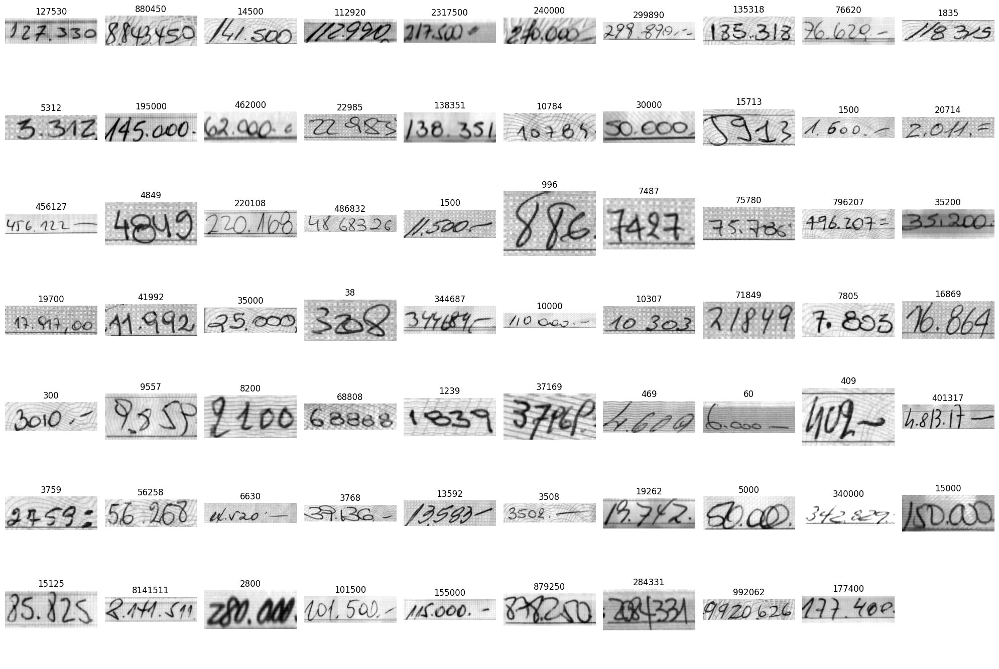

In [ ]:
plot_all_images(erosion_false_prediction )

total image:166


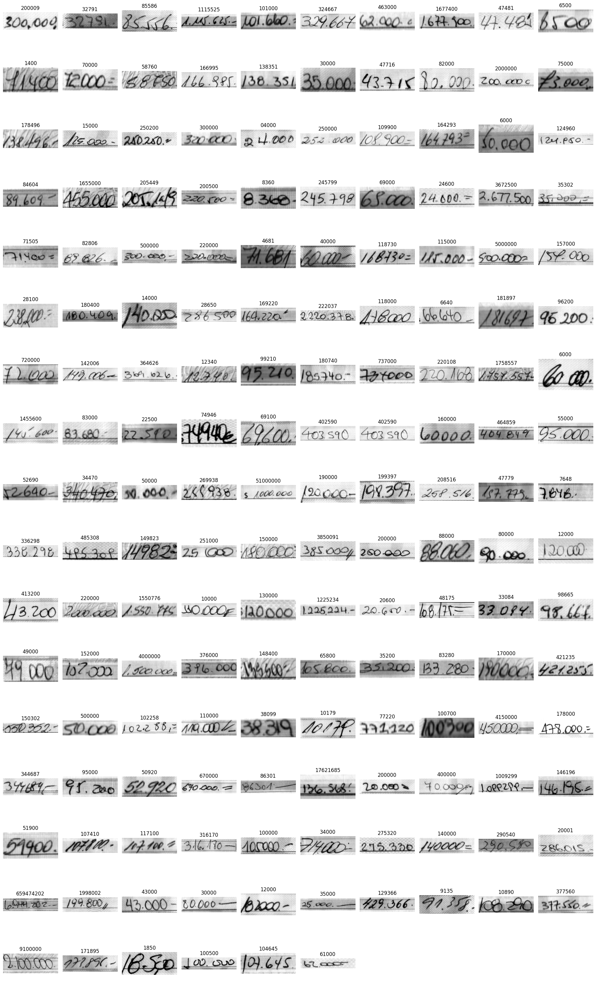

In [ ]:
plot_all_images(erosion_false_prediction )

# bluring

In [ ]:
def gaussian_blur_image(img, ksize=(5, 5), sigmaX=0):
  # Define the sharpening kernel
  blurred_image = cv2.GaussianBlur(img, ksize, sigmaX)

  return blurred_image

In [ ]:
# fourier_false_prediction
y_true =  [t_labels[train_size+i][0] for i in False_prediction]
corrosponding_images = [images[train_size+i][0] for i in False_prediction]


correct_char = 0
total_char = 0
correct = 0
total_image_predict = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

sharp_false_prediction = []
sharp_true_prediction = []
# print(f"total words:{len(fourier_false_prediction)}")
for i in range(len(y_true)):
    # fourier_improved_images = delete_noise_with_fourier(corrosponding_images[i])

    total_image_predict+=1
    fourier_improved_images = delete_noise_with_fourier(corrosponding_images[i])
    # blurred_image = gaussian_blur_image(corrosponding_images[i])
    blurred_image = gaussian_blur_image(fourier_improved_images)

    pr = prediction(blurred_image)
    tr = y_true[i]
    total_char += len(tr)
    # print(f"true : {tr} , pred : {pr}")
    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1
        sharp_true_prediction.append(blurred_image)
    else:
        sharp_false_prediction.append(blurred_image)


corrected_char_percent = round(correct_char*100/total_char,2)
corrected_char = round(corrected_char_percent/100*total_char)
corrected_numbers_percent = round(correct*100/total_image_predict,2)
corrected_numbers = round(corrected_numbers_percent/100*total_image_predict)

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print(f'Correct characters predicted : {corrected_char_percent}% = {corrected_char} from total chars:{total_char}')
print(f'Correct numbers predicted      : {corrected_numbers_percent}% = {corrected_numbers} from total numbers:{total_image_predict}')

Average Levenshtein distance: 1.1565656565656566
Correct characters predicted : 75.99% = 848 from total chars:1116
Correct numbers predicted      : 14.14% = 28 from total numbers:198


In [ ]:
plot_all_images(sharp_false_prediction[:10])

# added chracter to learn model

# change model to easier model

In [ ]:
from keras.layers import GRU

In [ ]:
input_data = Input(shape=(width_reshape, height_reshape, 1), name='input')

inner = Conv2D(32, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

inner = Conv2D(64, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)
inner = Dropout(0.3)(inner)

inner = Conv2D(128, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)
inner = Dropout(0.3)(inner)

# CNN to RNN
inner = Reshape(target_shape=((64, 1024)), name='reshape')(inner)#*******************
inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)

## RNN
inner = Bidirectional(GRU(256, return_sequences=True), name = 'GRU1')(inner)
inner = Bidirectional(GRU(256, return_sequences=True), name = 'GRU2')(inner)
# inner = (GRU(256, return_sequences=True))(inner)
# inner = (GRU(256, return_sequences=True))(inner)

## OUTPUT
inner = Dense(num_of_characters, kernel_initializer='he_normal',name='dense2')(inner)
y_pred = Activation('softmax', name='softmax')(inner)

model = Model(inputs=input_data, outputs=y_pred)
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 256, 64, 1)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 256, 64, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 256, 64, 32)         │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 256, 64, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max1 (MaxPooling2D)                  │ (None, 128, 32, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 128, 32, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 128, 32, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 128, 32, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max2 (MaxPooling2D)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 64, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 64, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 64, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max3 (MaxPooling2D)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 1024)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 64, 64)              │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ GRU1 (Bidirectional)                 │ (None, 64, 512)             │         494,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ GRU2 (Bidirectional)                 │ (None, 64, 512)             │       1,182,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense2 (Dense)                       │ (None, 64, 12)              │           6,1

 Total params: 1,842,636 (7.03 MB)

 Trainable params: 1,842,188 (7.03 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# the ctc loss function
import tensorflow as tf


def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

In [ ]:
# the loss calculation occurs elsewhere, so we use a dummy lambda function for the loss
model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

def scheduler(epoch, lr):
  if epoch != 15:
      return lr
  else:
      return 0.0001
call_back = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience= 6),#*************
    keras.callbacks.ModelCheckpoint(filepath= 'C_LSTM_best.keras', save_best_only= True, monitor="val_loss", verbose= 1),
    keras.callbacks.LearningRateScheduler(scheduler, verbose=1)
]
model_final.fit(x=[train_x, train_y, train_input_len, train_label_len], y=train_output,
                validation_data=([valid_x, valid_y, valid_input_len, valid_label_len], valid_output),
                epochs=60, batch_size=128,
                callbacks=call_back,
                # shuffle = True
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 21.1929
Epoch 1: val_loss improved from inf to 13.11254, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 26s 274ms/step - loss: 21.0995 - val_loss: 13.1125 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 11.3169
Epoch 2: val_loss improved from 13.11254 to 12.51128, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 20s 272ms/step - loss: 11.3151 - val_loss: 12.5113 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 10.4565
Epoch 3: val_loss improved from 12.51128 to 10.70518, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 20s 262ms/step - loss: 10.4494 - val_loss: 10.7052 - learning_rate

In [ ]:
preds = model.predict(valid_x)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


In [ ]:
import Levenshtein
y_true = [tup[0] for tup in t_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.1348122866894198
Correct characters predicted : 97.08%
Correct words predicted      : 88.44%
false prediction:271


# ignore bidirectional and just use LSTM

In [ ]:
input_data = Input(shape=(width_reshape, height_reshape, 1), name='input')

inner = Conv2D(32, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

inner = Conv2D(64, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)
inner = Dropout(0.3)(inner)

inner = Conv2D(128, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)
inner = Dropout(0.3)(inner)

# CNN to RNN
inner = Reshape(target_shape=((64, 1024)), name='reshape')(inner)#*******************
inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)

## RNN
inner = (LSTM(256, return_sequences=True))(inner)
inner = (LSTM(256, return_sequences=True))(inner)
# inner = (GRU(256, return_sequences=True))(inner)
# inner = (GRU(256, return_sequences=True))(inner)

## OUTPUT
inner = Dense(num_of_characters, kernel_initializer='he_normal',name='dense2')(inner)
y_pred = Activation('softmax', name='softmax')(inner)

model = Model(inputs=input_data, outputs=y_pred)
model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 256, 64, 1)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 256, 64, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 256, 64, 32)         │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_15 (Activation)           │ (None, 256, 64, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max1 (MaxPooling2D)                  │ (None, 128, 32, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 128, 32, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 128, 32, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_16 (Activation)           │ (None, 128, 32, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max2 (MaxPooling2D)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 64, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 64, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_17 (Activation)           │ (None, 64, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max3 (MaxPooling2D)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 1024)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 64, 64)              │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 64, 256)             │         328,704 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 64, 256)             │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense2 (Dense)                       │ (None, 64, 12)              │           3,0

 Total params: 1,016,268 (3.88 MB)

 Trainable params: 1,015,820 (3.88 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# the ctc loss function
import tensorflow as tf


def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

In [ ]:
# the loss calculation occurs elsewhere, so we use a dummy lambda function for the loss
model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

def scheduler(epoch, lr):
  if epoch != 15:
      return lr
  else:
      return 0.0001
call_back = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience= 6),#*************
    keras.callbacks.ModelCheckpoint(filepath= 'C_LSTM_best.keras', save_best_only= True, monitor="val_loss", verbose= 1),
    keras.callbacks.LearningRateScheduler(scheduler, verbose=1)
]
model_final.fit(x=[train_x, train_y, train_input_len, train_label_len], y=train_output,
                validation_data=([valid_x, valid_y, valid_input_len, valid_label_len], valid_output),
                epochs=60, batch_size=128,
                callbacks=call_back,
                # shuffle = True
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 22.5304
Epoch 1: val_loss improved from inf to 12.11758, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 22s 244ms/step - loss: 22.4210 - val_loss: 12.1176 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - loss: 11.5400
Epoch 2: val_loss improved from 12.11758 to 11.86626, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 19s 252ms/step - loss: 11.5398 - val_loss: 11.8663 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 11.3970
Epoch 3: val_loss improved from 11.86626 to 11.44957, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 19s 236ms/step - loss: 11.3961 - val_loss: 11.4496 - learning_rate

In [ ]:
preds = model.predict(valid_x)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


In [ ]:
import Levenshtein
y_true = [tup[0] for tup in t_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.8494027303754266
Correct characters predicted : 56.20%
Correct words predicted      : 27.52%
false prediction:1699


# reduce convolutional layer

In [ ]:
input_data = Input(shape=(width_reshape, height_reshape, 1), name='input')

inner = Conv2D(32, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

inner = Conv2D(64, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)
inner = Dropout(0.3)(inner)

# inner = Conv2D(128, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)
# inner = BatchNormalization()(inner)
# inner = Activation('relu')(inner)
# inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)
# inner = Dropout(0.3)(inner)

# CNN to RNN
inner = Reshape(target_shape=((64, 1024)), name='reshape')(inner)#*******************
inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)

## RNN
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm1')(inner)
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm2')(inner)

## OUTPUT
inner = Dense(num_of_characters, kernel_initializer='he_normal',name='dense2')(inner)
y_pred = Activation('softmax', name='softmax')(inner)

model = Model(inputs=input_data, outputs=y_pred)
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 256, 64, 1)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 256, 64, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 256, 64, 32)         │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 256, 64, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max1 (MaxPooling2D)                  │ (None, 128, 32, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 128, 32, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 128, 32, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 128, 32, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max2 (MaxPooling2D)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 1024)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 64, 64)              │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm1 (Bidirectional)                │ (None, 64, 512)             │         657,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm2 (Bidirectional)                │ (None, 64, 512)             │       1,574,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense2 (Dense)                       │ (None, 64, 12)              │           6,156 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ softmax (Activation)                 │ (None, 64, 12)              │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,323,276 (8.86 MB)

 Trainable params: 2,323,084 (8.86 MB)

 Non-trainable params: 192 (768.00 B)

In [ ]:
# the ctc loss function
import tensorflow as tf


def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

In [ ]:
# the loss calculation occurs elsewhere, so we use a dummy lambda function for the loss
model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

def scheduler(epoch, lr):
  if epoch != 15:
      return lr
  else:
      return 0.0001
call_back = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience= 6),#*************
    keras.callbacks.ModelCheckpoint(filepath= 'C_LSTM_best.keras', save_best_only= True, monitor="val_loss", verbose= 1),
    # keras.callbacks.LearningRateScheduler(scheduler, verbose=1)
]
model_final.fit(x=[train_x, train_y, train_input_len, train_label_len], y=train_output,
                validation_data=([valid_x, valid_y, valid_input_len, valid_label_len], valid_output),
                epochs=60, batch_size=128,
                callbacks=call_back,
                # shuffle = True
)

Epoch 1/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - loss: 22.7212
Epoch 1: val_loss improved from inf to 12.79023, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 24s 253ms/step - loss: 22.6123 - val_loss: 12.7902
Epoch 2/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 11.6959
Epoch 2: val_loss improved from 12.79023 to 11.92929, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 20s 245ms/step - loss: 11.6949 - val_loss: 11.9293
Epoch 3/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - loss: 11.4881
Epoch 3: val_loss improved from 11.92929 to 11.47786, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 18s 248ms/step - loss: 11.4866 - val_loss: 11.4779
Epoch 4/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - loss: 11.1191
Epoch 4: val_loss improved from 11.47786 to 11.21037, saving model to C_LSTM_best.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 20s 241ms/step - loss: 11.1190 - val_loss: 11.2104
Epoch 5/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - loss: 10.8050
E

In [ ]:
preds = model.predict(fourier_valid_x)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step


In [ ]:
import Levenshtein
y_true = [tup[0] for tup in t_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.22226962457337884
Correct characters predicted : 95.06%
Correct words predicted      : 82.64%
false prediction:407


In [ ]:
!cp /content/C_LSTM_best.keras /content/drive/MyDrive/CRNN_model.keras

# perform fourier transform on dataset , then train it

In [ ]:
fourier_train_x = []
fourier_valid_x =[]
print(len(train_x))
for i in train_x:
  fourier_train_x.append(delete_noise_with_fourier(np.squeeze(i)))#np.squeeze => (256,64,1)->(256,64)

fourier_valid_x = []
for i in valid_x:
  fourier_valid_x.append(delete_noise_with_fourier(np.squeeze(i)))

fourier_train_x = np.array(fourier_train_x).reshape(-1, width_reshape, height_reshape, 1)
fourier_valid_x = np.array(fourier_valid_x).reshape(-1, width_reshape, height_reshape, 1)

9375


In [ ]:
input_data = Input(shape=(width_reshape, height_reshape, 1), name='input')

inner = Conv2D(32, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max1')(inner)

inner = Conv2D(64, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(2, 2), name='max2')(inner)
inner = Dropout(0.3)(inner)

inner = Conv2D(128, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(inner)
inner = BatchNormalization()(inner)
inner = Activation('relu')(inner)
inner = MaxPooling2D(pool_size=(1, 2), name='max3')(inner)
inner = Dropout(0.3)(inner)

# CNN to RNN
inner = Reshape(target_shape=((64, 1024)), name='reshape')(inner)#*******************
inner = Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(inner)

## RNN
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm1')(inner)
inner = Bidirectional(LSTM(256, return_sequences=True), name = 'lstm2')(inner)

## OUTPUT
inner = Dense(num_of_characters, kernel_initializer='he_normal',name='dense2')(inner)
y_pred = Activation('softmax', name='softmax')(inner)

model = Model(inputs=input_data, outputs=y_pred)
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)                   │ (None, 256, 64, 1)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 256, 64, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256, 64, 32)         │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 256, 64, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max1 (MaxPooling2D)                  │ (None, 128, 32, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 128, 32, 64)         │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 128, 32, 64)         │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 128, 32, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max2 (MaxPooling2D)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 64, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 64, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max3 (MaxPooling2D)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64, 8, 128)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 64, 1024)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 64, 64)              │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm1 (Bidirectional)                │ (None, 64, 512)             │         657,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm2 (Bidirectional)                │ (None, 64, 512)             │       1,574,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense2 (Dense)                       │ (None, 64, 12)              │           6,1

 Total params: 2,397,644 (9.15 MB)

 Trainable params: 2,397,196 (9.14 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# the ctc loss function
import tensorflow as tf


def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    # the 2 is critical here since the first couple outputs of the RNN
    # tend to be garbage
    y_pred = y_pred[:, 2:, :]
    # return K.ctc_batch_cost(labels, y_pred, input_length, label_length)
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

In [ ]:
labels = Input(name='gtruth_labels', shape=[max_str_len], dtype='float32')
input_length = Input(name='input_length', shape=[1], dtype='int64')
label_length = Input(name='label_length', shape=[1], dtype='int64')

ctc_loss = Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([y_pred, labels, input_length, label_length])
model_final = Model(inputs=[input_data, labels, input_length, label_length], outputs=ctc_loss)

In [ ]:
# the loss calculation occurs elsewhere, so we use a dummy lambda function for the loss
model_final.compile(loss={'ctc': lambda y_true, y_pred: y_pred}, optimizer=Adam(learning_rate = 0.001))

def scheduler(epoch, lr):
  if epoch != 19:
      return lr
  else:
      return 0.0001
call_back = [
    keras.callbacks.EarlyStopping(monitor="val_loss", patience= 6),#*************
    keras.callbacks.ModelCheckpoint(filepath= 'CRNN_with_fourier_dataset.keras', save_best_only= True, monitor="val_loss", verbose= 1),
    keras.callbacks.LearningRateScheduler(scheduler, verbose=1)
]
model_final.fit(x=[fourier_train_x, train_y, train_input_len, train_label_len], y=train_output,
                validation_data=([fourier_valid_x, valid_y, valid_input_len, valid_label_len], valid_output),
                epochs=60, batch_size=128,
                callbacks=call_back,
                # shuffle = True
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 23.4286
Epoch 1: val_loss improved from inf to 12.93763, saving model to CRNN_with_fourier_dataset.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 38s 291ms/step - loss: 23.3109 - val_loss: 12.9376 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 11.5174
Epoch 2: val_loss did not improve from 12.93763
74/74 ━━━━━━━━━━━━━━━━━━━━ 40s 285ms/step - loss: 11.5162 - val_loss: 13.2425 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/60
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - loss: 11.2154
Epoch 3: val_loss improved from 12.93763 to 11.28025, saving model to CRNN_with_fourier_dataset.keras
74/74 ━━━━━━━━━━━━━━━━━━━━ 41s 286ms/step - loss: 11.2144 - val_loss: 11.2802 - learning_rate: 0.0010

Ep

In [ ]:
preds = model.predict(fourier_valid_x)
decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(preds, input_length=np.ones(preds.shape[0])*preds.shape[1],
                                   greedy=True)[0][0])

prediction = []
for i in range(valid_size):
    prediction.append(num_to_label(decoded[i]))

74/74 ━━━━━━━━━━━━━━━━━━━━ 47s 633ms/step


In [ ]:
import Levenshtein
y_true = [tup[0] for tup in t_labels[train_size:]]
correct_char = 0
total_char = 0
correct = 0
#for levenshtein distance
total_distance = 0
comparisons= 0

False_prediction = []
for i in range(valid_size):
    pr = prediction[i]
    tr = y_true[i]
    total_char += len(tr)

    for j in range(min(len(tr), len(pr))):
        if tr[j] == pr[j]:
            correct_char += 1

    total_distance += Levenshtein.distance(pr , tr)
    comparisons += 1
    if pr == tr :
        correct += 1

    else:
        False_prediction.append(i)
        # print(f"index of False prediction:{i}")

print(f"Average Levenshtein distance: {total_distance / comparisons}")
print('Correct characters predicted : %.2f%%' %(correct_char*100/total_char))
print('Correct words predicted      : %.2f%%' %(correct*100/valid_size))
print(f"false prediction:{len(False_prediction)}")

Average Levenshtein distance: 0.11006825938566553
Correct characters predicted : 97.58%
Correct words predicted      : 90.40%
false prediction:225


In [ ]:
print(False_prediction)

[6, 15, 20, 28, 44, 45, 59, 72, 88, 101, 127, 128, 186, 189, 219, 223, 232, 235, 253, 262, 284, 295, 300, 311, 322, 332, 333, 334, 336, 374, 377, 390, 392, 414, 428, 431, 433, 441, 448, 456, 458, 480, 494, 495, 500, 503, 505, 511, 512, 536, 537, 542, 543, 555, 558, 559, 564, 571, 578, 583, 589, 599, 600, 615, 633, 641, 643, 646, 651, 653, 666, 675, 679, 683, 685, 703, 715, 721, 723, 728, 731, 791, 801, 813, 814, 815, 818, 841, 844, 853, 881, 884, 900, 912, 937, 938, 949, 958, 967, 971, 972, 977, 982, 1001, 1002, 1005, 1030, 1038, 1064, 1070, 1077, 1082, 1100, 1101, 1103, 1105, 1108, 1133, 1138, 1157, 1159, 1161, 1177, 1180, 1182, 1194, 1196, 1204, 1207, 1217, 1229, 1237, 1249, 1257, 1286, 1299, 1303, 1308, 1325, 1332, 1336, 1337, 1340, 1354, 1360, 1365, 1381, 1391, 1396, 1417, 1425, 1437, 1443, 1448, 1459, 1484, 1514, 1536, 1537, 1538, 1542, 1543, 1546, 1548, 1549, 1597, 1614, 1621, 1622, 1625, 1645, 1655, 1664, 1667, 1681, 1682, 1688, 1705, 1721, 1745, 1762, 1767, 1806, 1809, 1817, 18

total image:225


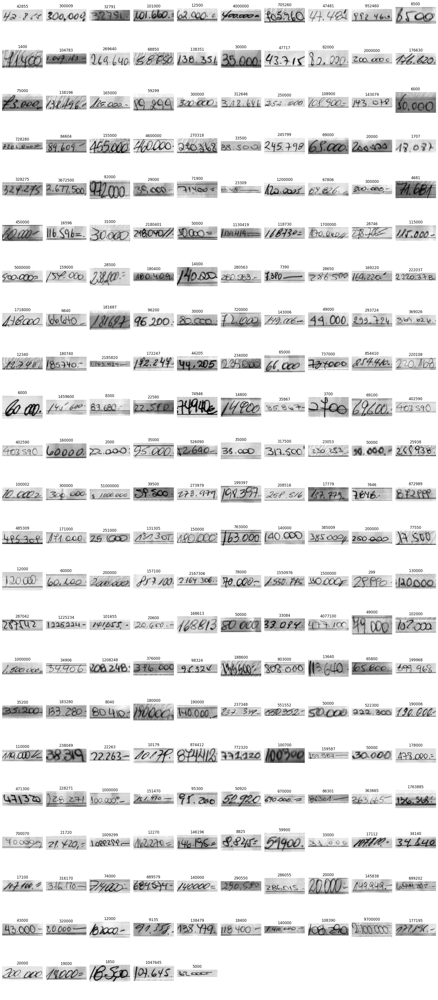

In [ ]:
def prediction(gray_img):
  image = preprocess(gray_img)
  image = image/255.
  pred = model.predict(image.reshape(1, 256, 64, 1) ,verbose=0 )
  decoded = tf.keras.backend.get_value(tf.keras.backend.ctc_decode(pred, input_length=np.ones(pred.shape[0])*pred.shape[1],
                                      greedy=True)[0][0])
  res = num_to_label(decoded[0])
  return res
plot_all_images([delete_noise_with_fourier(images[train_size + index][0]) for index in False_prediction ] )

In [ ]:
!cp /content/CRNN_random_train_data.keras  /content/drive/MyDrive

# LOAD MODEL

In [ ]:
# !cp  /content/drive/MyDrive/CRNN_model.keras /content/CRNN_model.keras
model_path='/content/drive/MyDrive/CRNN_random_train_data.keras'
# model_path='/content/drive/MyDrive/CRNN_with_fourier_dataset.keras'
model.load_weights(model_path)